## Описание проекта
Вы решили открыть небольшое кафе в Москве. Оно оригинальное — гостей должны обслуживать роботы. Проект многообещающий, но дорогой. Вместе с партнёрами вы решились обратиться к инвесторам. Их интересует текущее положение дел на рынке — сможете ли вы снискать популярность на долгое время, когда все зеваки насмотрятся на роботов-официантов?
Вы — гуру аналитики, и партнёры просят вас подготовить исследование рынка. У вас есть открытые данные о заведениях общественного питания в Москве.

## Оглавление

## Шаг №1. Загрузите данные и подготовьте их к анализу

## Шаг №2. Анализ данных

 - Исследуйте соотношение видов объектов общественного питания по количеству. Постройте график.
 - Исследуйте соотношение сетевых и несетевых заведений по количеству. Постройте график.
 - Для какого вида объекта общественного питания характерно сетевое распространение?
 - Что характерно для сетевых заведений: много заведений с небольшим числом посадочных мест в каждом или мало заведений с большим количеством посадочных мест?
 - Для каждого вида объекта общественного питания опишите среднее количество посадочных мест. Какой вид предоставляет в среднем самое большое количество посадочных мест? Постройте графики.
 - Выделите в отдельный столбец информацию об улице из столбца address .
 - Постройте график топ-10 улиц по количеству объектов общественного питания. Воспользуйтесь внешней информацией и ответьте на вопрос — в каких районах Москвы находятся эти улицы?
 - Найдите число улиц с одним объектом общественного питания. Воспользуйтесь внешней информацией и ответьте на вопрос в каких районах Москвы находятся эти улицы?
 - Посмотрите на распределение количества посадочных мест для улиц с большим количеством объектов общественного питания. Какие закономерности можно выявить?
 - Сделайте общий вывод и дайте рекомендации о виде заведения, количестве посадочных мест, а также районе расположения. Прокомментируйте возможность развития сети.
## Общий вывод
 
##  Подготовка презентации

## Шаг №1. Загрузите данные и подготовьте их к анализу

### Загрузка библиотек

In [1]:
!pip install geopandas

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 962 kB 809 kB/s eta 0:00:01
     |████████████████████████████████| 10.9 MB 13.5 MB/s eta 0:00:01
     |████████████████████████████████| 14.7 MB 45.8 MB/s eta 0:00:01    |███████████████████▉            | 9.1 MB 45.8 MB/s eta 0:00:01
     |████████████████████████████████| 1.8 MB 409 kB/s eta 0:00:01
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [2]:
import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)
import scipy.stats as stats
from matplotlib import pyplot as plt
import numpy as np
import plotly.graph_objects as go
from collections import defaultdict
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
import warnings
import geopandas
from shapely.geometry import Point
import seaborn as sns
warnings.filterwarnings('ignore')

### Загрузка данных

In [3]:
rest_data = pd.read_csv('/datasets/rest_data.csv')
rest_data.head()

,id,object_name,chain,object_type,address,number
0,151635,СМЕТАНА,нет,кафе,"город Москва, улица Егора Абакумова, дом 9",48
1,77874,Родник,нет,кафе,"город Москва, улица Талалихина, дом 2/1, корпус 1",35
2,24309,Кафе «Академия»,нет,кафе,"город Москва, Абельмановская улица, дом 6",95
3,21894,ПИЦЦЕТОРИЯ,да,кафе,"город Москва, Абрамцевская улица, дом 1",40
4,119365,Кафе «Вишневая метель»,нет,кафе,"город Москва, Абрамцевская улица, дом 9, корпус 1",50


В датафрейме у нас информация по заведениям общественного питания г. Москвы, где есть следующие столбцы

Таблица rest_data:
- object_name — название объекта общественного питания;
- chain — сетевой ресторан;
- object_type — тип объекта общественного питания;
- address — адрес;
- number — количество посадочных мест.

### Предобработка данных

####  Посмотрим обую информацию

In [4]:
rest_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15366 entries, 0 to 15365
Data columns (total 6 columns):
id             15366 non-null int64
object_name    15366 non-null object
chain          15366 non-null object
object_type    15366 non-null object
address        15366 non-null object
number         15366 non-null int64
dtypes: int64(2), object(4)
memory usage: 720.4+ KB


Типы данных в столбцов правильные и не требуют правки!

#### Проверим данные на дубликаты 

In [5]:
rest_data.duplicated().sum()

0

Отлично! в данных не содержится дубликатов

In [6]:
rest_data.isnull().sum()

id             0
object_name    0
chain          0
object_type    0
address        0
number         0
dtype: int64

### Проверим на скрытые дубликаты

In [7]:
# Переведем название объектов в нижний регистр

rest_data['object_name']= rest_data['object_name'].str.lower()

# Проверим на дубликаты

rest_data.duplicated().sum()

0

Дубликаты также не обнаружены, возможно нам мешает столбец 'id', посмотрим вручную.

In [8]:
rest_data = rest_data.sort_values('address')
rest_data.head(150)

,id,object_name,chain,object_type,address,number
7691,132359,кафе «la carotte»,нет,кафе,"1-й Нагатинский проезд, дом 10",198
8903,25036,якитория,да,кафе,"1-я Тверская-Ямская улица, дом 29/66, корпус 1",456
8776,26477,ресторан «2545»,нет,ресторан,"2-я Брестская улица, дом 1, строение 1",30
10715,178003,столовая,нет,столовая,"2-я Брестская улица, дом 5, строение 1",30
8860,83951,бункер 42 на таганке,нет,ресторан,"5-й Котельнический переулок, дом 11",271
12017,186541,лукойл-центрнефтьпродукт,да,кафе,"Алтуфьевское шоссе, дом 52А",10
13184,192903,сабрина,нет,кафе,"Бауманская улица, дом 7, строение 3",30
13185,192918,limassol,нет,кафе,"Бауманская улица, дом 7, строение 3",42
8773,101149,кафе «музыкальный клуб форте»,нет,кафе,"Большая Бронная улица, дом 20/1/27, строение 2",74
10458,174842,блэк стоун,нет,бар,"Большая Серпуховская улица, дом 48, строение 2",15


8808	24987	шаурма на углях-чайхана баракат	нет	кафе	Таганская площадь, дом 88, строение 4	80

13991	204917	шаурма на углях- чайхана баракат	нет	кафе	Таганская площадь, дом 88, строение 4	80

Вот есть по крайней мере один дубликат - и у этих объектов разные id, поэтому удаляем столбец

In [9]:
del rest_data['id']

In [10]:
# Смотрим на дубликаты еще раз

rest_data.duplicated().sum()

85

Без столбца id их нашлось 85 штук)

In [11]:
# Удалим дубликаты и сделаем проверку

rest_data=rest_data.drop_duplicates()
rest_data.duplicated().sum()

0

##  Вывод по шагу №1
Предоставленные данные о ресторанах г. Москвы имеют правильный формат данных, пропущенные значения. В Дататфрейме обнаружено 85 скрытых дубликатов. Кто-то занес 85 заведений по одному адресу дважды под  разным id. Следует обратить на это внимание в дальнейшем

## Шаг №2. Анализ данных
###  Исследуйте соотношение видов объектов общественного питания по количеству. Постройте график.


In [12]:
# Сгрупируем данные
rest_data_object_type = rest_data.groupby('object_type').agg({'object_type': 'count'})
rest_data_object_type.columns = ['count']
rest_data_object_type = rest_data_object_type.sort_values('count',ascending=False)
rest_data_object_type

,count
object_type,
кафе,6071
столовая,2584
ресторан,2282
предприятие быстрого обслуживания,1897
бар,855
буфет,576
кафетерий,395
закусочная,348
магазин (отдел кулинарии),273


Перед нами общее количество заведений, разбитых по типу. Теперь построим круговую диаграму

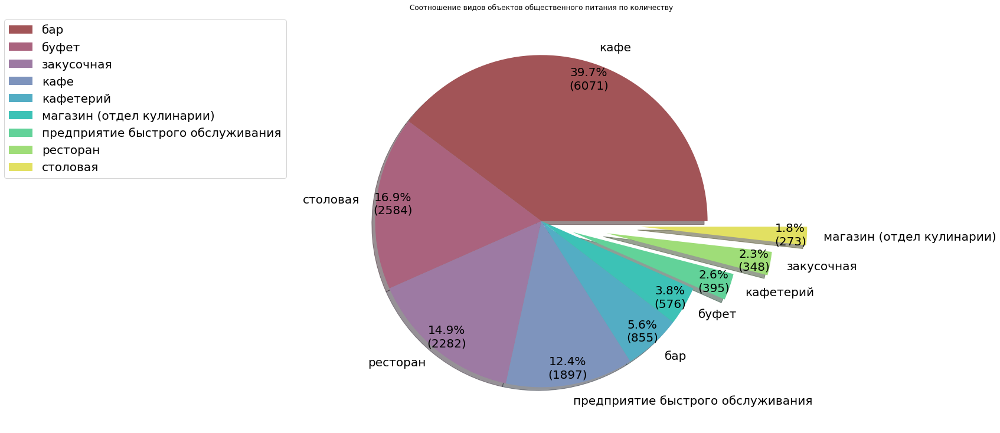

In [13]:
summary = rest_data_object_type.values.sum()

# Напишем функцию для подсчета процентовки

def func_pct(pct):
    value = float(pct/100.*summary)
    #mean = visits_by_device.mean()
    return "{:.1f}%\n({:.0f})".format(pct, value)

explode = (0,
           0,
           0,
           0,
           0,
           0,
           0.2,
           0.4,
           0.6
          )
# Оформим график

ax_pie = rest_data_object_type.plot(kind='pie',
                               y='count',
                               use_index=False,
                               shadow=True,
                               explode=explode,
                               title = 'Cоотношение видов объектов общественного питания по количеству',  
                               fontsize=20,
                               pctdistance=0.9,
                               figsize=(20,10), 
                               autopct=lambda pct: func_pct(pct),
                               colors=['#A25457',
                                       '#AA637E',
                                       '#9D7AA3',
                                       '#7E94BD',
                                       '#53ADC4',
                                       '#3CC2B6',
                                       '#62D299',
                                       '#9FDD78',
                                       '#E2E062'])
                                      #labels=None)

plt.tight_layout(pad=0)

legend = ax_pie.legend(['бар',
                        'буфет',
                        'закусочная',
                        'кафе',
                        'кафетерий',
                        'магазин (отдел кулинарии)',
                        'предприятие быстрого обслуживания',
                        'ресторан',
                        'столовая'], 
                       bbox_to_anchor=(-0.1,1), 
                       prop={'size':20})

y_label = ax_pie.set_ylabel('')

В лидерах по количеству заведений у нас кафе, столовые и рестораны)

### Исследуйте соотношение сетевых и несетевых заведений по количеству. Постройте график.


In [14]:
# Сгрупируем данные
rest_data_chain = rest_data.groupby('chain').agg({'chain': 'count'})
rest_data_chain

,chain
chain,
да,2964
нет,12317


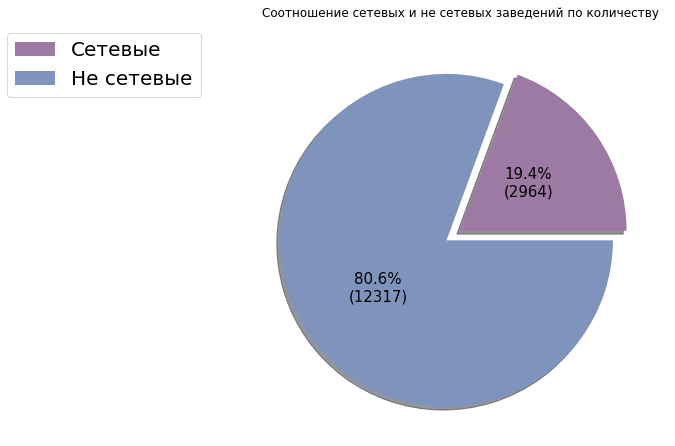

In [15]:
summary = rest_data_object_type.values.sum()

# Напишем функцию для подсчета процентовки

def func_pct(pct):
    value = float(pct/100.*summary)
    return "{:.1f}%\n({:.0f})".format(pct, value)
explode = (0,
           0.1)

# Оформим график

ax_pie = rest_data_chain.plot(kind='pie',
                               y='chain',
                               fontsize=15, 
                               use_index=False,
                               shadow=True,
                               explode=explode,
                               title = 'Cоотношение сетевых и не сетевых заведений по количеству',
                               pctdistance=0.5,
                               figsize=(12,6), 
                               autopct=lambda pct: func_pct(pct),
                               colors=['#9D7AA3',
                                       '#7E94BD'],
                                      labels=None)

plt.tight_layout(pad=0)

legend = ax_pie.legend(['Сетевые',
                        'Не сетевые',
                        ], 
                       bbox_to_anchor=(-0.1,1), 
                       prop={'size':20})

y_label = ax_pie.set_ylabel('')

80 % заведений нашего датафрейма являются сетевыми

### Для какого вида объекта общественного питания характерно сетевое распространение?

In [16]:
# Сгруппируем данные по распределенина сетевые и не сетевые заведения

data_chain = rest_data.pivot_table(index=['object_type'],
                                   columns=['chain'],
                                   values='object_name',
                                   aggfunc='count').reset_index()

# Переименуем столбцы

data_chain.columns=['object_type',
                    'franchise',
                    'author']

# Рассчитаем долю сетевых заведений для каждой группы

data_chain['%_franchise'] = ((data_chain['franchise']/data_chain['author']*100)).round(1)

# Отсортируем данные по доли сетевых заведений по убыванию

data_chain = data_chain.sort_values('%_franchise',ascending=False).reset_index()
data_chain

,index,object_type,franchise,author,%_franchise
0,6,предприятие быстрого обслуживания,788,1109,71.1
1,5,магазин (отдел кулинарии),78,195,40.0
2,7,ресторан,543,1739,31.2
3,3,кафе,1396,4675,29.9
4,2,закусочная,56,292,19.2
5,4,кафетерий,52,343,15.2
6,0,бар,37,818,4.5
7,1,буфет,11,565,1.9
8,8,столовая,3,2581,0.1


In [17]:
# Выведем таблицу на график

def data_chain_gr(p1,p2,p3,title):
    fig = go.Figure(data=[
        go.Bar(name= p1,
               x=data_chain.object_type,
               y=data_chain[p1],
               text=data_chain[p1],
               textposition='auto'),
       
        go.Bar(name= p2,
               x=data_chain.object_type,
               y=data_chain[p2],
               text=data_chain[p2],
               textposition='auto'),
        
        go.Bar(name= p3,
               x=data_chain.object_type,
               y=data_chain[p3],
               text=data_chain[p3],
               textposition='auto')
        
    ])
    
   
    fig.update_layout(xaxis_title_text='Тип заведения',
                      yaxis_title_text='Колличество',
                      barmode='group',
                      title_text= title
                      )
    
    
    
    fig.show()
    
data_chain_gr('franchise','author','%_franchise','Соотношение кол-ва заведений сетевое/не сетовое')

Самое высокое сетевое распростронение характерно для таких заведений, как:
 - Предприятие быстрого обслуживания( почти 70% заведений - сетевые)
 - Кулинария (40% сетевых заведений)
 - Ресторан (31% сетевых заведений)
 - Кафе (29% сетевых зачедений)

### Что характерно для сетевых заведений: много заведений с небольшим числом посадочных мест в каждом или мало заведений с большим количеством посадочных мест?

In [18]:
# Выделим заведения, которые являются сетевыми

rest_data_set= rest_data.query('chain == "да"')

# Сгрупируем данны по количеству заведений и добавим среднее кол-во посадочных мест

rest_data_set_num= rest_data_set.groupby('object_type').agg({'chain': 'count',
                                                             'number':'median'}).reset_index()

# Переведем среднее кол-во посадочных мест в целое число

rest_data_set_num['number']=rest_data_set_num['number'].astype('int')

# отсортируем данные по количеству заведений по убыванию

rest_data_set_num=rest_data_set_num.sort_values('number',
                                               ascending=False)
                                                
rest_data_set_num

,object_type,chain,number
8,столовая,3,120
7,ресторан,543,89
0,бар,37,45
3,кафе,1396,40
6,предприятие быстрого обслуживания,788,25
2,закусочная,56,8
4,кафетерий,52,8
5,магазин (отдел кулинарии),78,3
1,буфет,11,0


In [19]:
fig = go.Figure([go.Bar(x=rest_data_set_num['object_type'],
                        y=rest_data_set_num.number,
                        text = rest_data_set_num.number,
                        textposition = 'auto')])

fig.update_layout(xaxis_title_text='Названия улиц',
                   yaxis_title_text='Кол-во посадочных мест',
                   barmode='group',
                   title_text= 'Медианное кол-во посадочных мест по сетевому виду объекта')
                 
fig.show()

Для сетевых заведений характерно большое количество точек с не большими заламии на 40-50 посадочных мест

### Для каждого вида объекта общественного питания опишите среднее количество посадочных мест. Какой вид предоставляет в среднем самое большое количество посадочных мест? Постройте графики.

In [20]:
rest_data_set_num = rest_data_set_num.sort_values('number',
                                                ascending=False)

def rest_data_gr1(p1,p2,title):
    fig = go.Figure(data=[
        go.Bar(name= p1,
               x=rest_data_set_num.object_type,
               y=rest_data_set_num[p1],
               text=rest_data_set_num[p1],
               textposition='auto'),
       
        go.Bar(name= p2,
               x=rest_data_set_num.object_type,
               y=rest_data_set_num[p2],
               text=rest_data_set_num[p2],
               textposition='auto')
        
    ])
    
   
    fig.update_layout(xaxis_title_text='Тип заведения(синия шкала),кол-во посадочных мест(оранжевая шкала)',
                      yaxis_title_text='Колличество',
                      barmode='group',
                      title_text= title)
    
    fig.show()
    
rest_data_gr1('chain','number',
          'Соотношение кол-ва заведений по типу и кол-ву посадочных мест на одно заведение')


Самое большое количество посадочных мест на заведение принадлежит столовым и ресторанам, так как первым нужно уместить максимальное количество гостей в прайм-тайм(обед , ужин и тд), а ресторанам проводить крупные мероприятия(свадьбы, корпаративы и тд)

### Выделите в отдельный столбец информацию об улице из столбца address .

In [21]:
rest_data['street']= rest_data['address'].str.split(',',expand=True)[1]
rest_data.head()

,object_name,chain,object_type,address,number,street
7691,кафе «la carotte»,нет,кафе,"1-й Нагатинский проезд, дом 10",198,дом 10
8903,якитория,да,кафе,"1-я Тверская-Ямская улица, дом 29/66, корпус 1",456,дом 29/66
8776,ресторан «2545»,нет,ресторан,"2-я Брестская улица, дом 1, строение 1",30,дом 1
10715,столовая,нет,столовая,"2-я Брестская улица, дом 5, строение 1",30,дом 5
8860,бункер 42 на таганке,нет,ресторан,"5-й Котельнический переулок, дом 11",271,дом 11


Улицы успешно добавлены в столбец street)

### Постройте график топ-10 улиц по количеству объектов общественного питания. Воспользуйтесь внешней информацией и ответьте на вопрос — в каких районах Москвы находятся эти улицы?

In [22]:
top10streets= rest_data.groupby('street').agg({'object_name': 'count',
                                               'number': 'sum'}).reset_index()
top10streets= top10streets.sort_values('object_name',ascending=False).head(12)
top10streets.reset_index()

,index,street,object_name,number
0,1334,город Зеленоград,232,17050
1,1452,проспект Мира,203,12790
2,993,Профсоюзная улица,181,8447
3,683,Ленинградский проспект,170,8970
4,979,Пресненская набережная,167,7656
5,407,Варшавское шоссе,161,8513
6,686,Ленинский проспект,147,9330
7,1419,поселение Сосенское,137,3097
8,1449,проспект Вернадского,128,8807
9,674,Кутузовский проспект,114,9697


In [23]:
top10streets = top10streets.drop(index=[1419])
top10streets

,street,object_name,number
1334,город Зеленоград,232,17050
1452,проспект Мира,203,12790
993,Профсоюзная улица,181,8447
683,Ленинградский проспект,170,8970
979,Пресненская набережная,167,7656
407,Варшавское шоссе,161,8513
686,Ленинский проспект,147,9330
1449,проспект Вернадского,128,8807
674,Кутузовский проспект,114,9697
600,Каширское шоссе,111,6161


In [24]:
top10streets = top10streets.drop(index=[1334])
top10streets

,street,object_name,number
1452,проспект Мира,203,12790
993,Профсоюзная улица,181,8447
683,Ленинградский проспект,170,8970
979,Пресненская набережная,167,7656
407,Варшавское шоссе,161,8513
686,Ленинский проспект,147,9330
1449,проспект Вернадского,128,8807
674,Кутузовский проспект,114,9697
600,Каширское шоссе,111,6161
605,Кировоградская улица,108,6457


In [25]:
# Постороим График по таблице 

fig = go.Figure([go.Bar(x=top10streets['street'],
                        y=top10streets.object_name,
                        text = top10streets.object_name,
                       textposition = 'auto')])

fig.update_layout(xaxis_title_text='Названия улиц',
                   yaxis_title_text='Колличество объектов',
                   barmode='group',
                   title_text= 'Топ 10 улиц по количеству объектов')
                 
fig.show()

### Загрузим классификатор улиц

In [26]:
import requests as r
url = 'https://geocode-maps.yandex.ru/1.x/?format=json&apikey=e6fc83ce-f095-4da2-a33c-41a7de7a92d3&geocode='

In [27]:
# Получим координаты наших улиц через API яндекс карт

latitudes = []
longitudes = []

for rest_address in top10streets['street']:
    if rest_address == rest_address: 
        url_formatted = url + 'Москва, ' + rest_address  
        response = r.get(url_formatted).json()
        try:  
            point = response['response']['GeoObjectCollection']['featureMember'][0]['GeoObject']['Point'].get('pos')
        except:  
            pass
        if point is not None:  
            latitude = float(point.split()[1].lstrip('('))
            longitude = float(point.split()[0].lstrip('('))
            latitudes.append(latitude)
            longitudes.append(longitude)
        else:  
            latitudes.append('')
            longitudes.append('')  
    else:  
        latitudes.append('')
        longitudes.append('')

In [28]:
latitudes, longitudes

([55.812363,
  55.649525,
  55.794285,
  55.746932,
  55.599799,
  55.68263,
  55.681656,
  55.735013,
  55.641244,
  55.614455],
 [37.637928,
  37.532511,
  37.545626,
  37.541404,
  37.603954,
  37.537137,
  37.515335,
  37.50911,
  37.683194,
  37.605023])

In [29]:
# Добавим столбцы с координатами в таблицу с 10 топ улицами
top10streets['latitude'] = latitudes
top10streets['longitude'] = longitudes
top10streets

,street,object_name,number,latitude,longitude
1452,проспект Мира,203,12790,55.812363,37.637928
993,Профсоюзная улица,181,8447,55.649525,37.532511
683,Ленинградский проспект,170,8970,55.794285,37.545626
979,Пресненская набережная,167,7656,55.746932,37.541404
407,Варшавское шоссе,161,8513,55.599799,37.603954
686,Ленинский проспект,147,9330,55.682630,37.537137
1449,проспект Вернадского,128,8807,55.681656,37.515335
674,Кутузовский проспект,114,9697,55.735013,37.509110
600,Каширское шоссе,111,6161,55.641244,37.683194
605,Кировоградская улица,108,6457,55.614455,37.605023


In [30]:
# Выгрузим наш датасет с границами районов Москвы
df1= geopandas.read_file("http://gis-lab.info/data/mos-adm/mo.geojson",driver='GeoJSON')
df1

NAME     OKATO     OKTMO           NAME_AO  \
0    Киевский                   45298555  45945000  Троицкий           
1    Филёвский Парк             45268595  45328000  Западный           
2    Новофёдоровское            45298567  45954000  Троицкий           
3    Роговское                  45298575  45956000  Троицкий           
4    "Мосрентген"               45297568  45953000  Новомосковский     
5    Вороновское                45298553  45943000  Троицкий           
6    Михайлово-Ярцевское        45298564  45951000  Троицкий           
7    Марушкинское               45297562  45949000  Новомосковский     
8    Первомайское               45298572  45955000  Троицкий           
9    Матушкино                  45272562  45331000  Зеленоградский     
10   Внуково                    45268552  45317000  Западный           
11   Савёлки                    45272568  45377000  Зеленоградский     
12   Внуковское                 45297552  45941000  Новомосковский     
13   Силино                     45272572  45332000  Зеленоградский     
14   Кокошкино                  45297559  45947000  Новомосковский     
15   Крюково                    45272580  45330000  Зеленоградский     
16   Щукино                     45283587  45372000  Северо-Западный    
17   Краснопахорское            45298561  45948000  Троицкий           
18   Нагатинский Затон          45296573  45919000  Южный              
19   Старое Крюково             45272576  45927000  Зеленоградский     
20   Клёновское                 45298558  45946000  Троицкий           
21   Дмитровский                45277574  45339000  Северный           
22   Филимонковское             45297577  45959000  Новомосковский     
23   Троицк                     45298578  45931000  Троицкий           
24   Тёплый Стан                45293586  45907000  Юго-Западный       
25   Щаповское                  45298583  45961000  Троицкий           
26   Московский                 45297565  45952000  Новомосковский     
27   Десёновское                45297556  45944000  Новомосковский     
28   Ховрино                    45277595  45347000  Северный           
29   Ломоносовский              45293574  45904000  Юго-Западный       
30   Можайский                  45268569  45321000  Западный           
31   Ново-Переделкино           45268577  45322000  Западный           
32   Строгино                   45283577  45370000  Северо-Западный    
33   Молжаниновский             45277584  45343000  Северный           
34   Митино                     45283559  45367000  Северо-Западный    
35   Куркино                    45283555  45366000  Северо-Западный    
36   Крылатское                 45268560  45319000  Западный           
37   Солнцево                   45268588  45326000  Западный           
38   Сосенское                  45297574  45958000  Новомосковский     
39   Воскресенское              45297554  45942000  Новомосковский     
40   Головинский                45277571  45338000  Северный           
41   Южное Тушино               45283593  45373000  Северо-Западный    
42   Северное Тушино            45283573  45369000  Северо-Западный    
43   Черёмушки                  45293590  45908000  Юго-Западный       
44   Покровское-Стрешнево       45283569  45368000  Северо-Западный    
45   Хорошёво-Мнёвники          45283582  45371000  Северо-Западный    
46   Очаково-Матвеевское        45268579  45323000  Западный           
47   Тропарёво-Никулино         45268592  45327000  Западный           
48   Левобережный               45277583  45342000  Северный           
49   Фили-Давыдково             45268597  45329000  Западный           
50   Обручевский                45293578  45905000  Юго-Западный       
51   Рязановское                45297571  45957000  Новомосковский     
52   Раменки                    45268584  45325000  Западный           
53   Войковский                 45277565  45336000  Северный           
54   Сокол                      45277589  45345000  Северный      

Датасейт я взял с сайта https://gis-lab.info/qa/moscow-atd.html

In [31]:
# Напишем функцию, проверяющие вход координат в границу района и выдающее название района
def rayon(row):
    try:
        return df1[df1['geometry'].contains(Point(row.longitude, row.latitude))]['NAME'].values[0]
    except:
        return np.NaN

# Заполним данные при помощи функции rayon
top10streets['district'] = top10streets.apply(rayon, axis=1)
top10streets

,street,object_name,number,latitude,longitude,district
1452,проспект Мира,203,12790,55.812363,37.637928,Алексеевский
993,Профсоюзная улица,181,8447,55.649525,37.532511,Коньково
683,Ленинградский проспект,170,8970,55.794285,37.545626,Хорошёвский
979,Пресненская набережная,167,7656,55.746932,37.541404,Пресненский
407,Варшавское шоссе,161,8513,55.599799,37.603954,Чертаново Южное
686,Ленинский проспект,147,9330,55.682630,37.537137,Ломоносовский
1449,проспект Вернадского,128,8807,55.681656,37.515335,Ломоносовский
674,Кутузовский проспект,114,9697,55.735013,37.509110,Дорогомилово
600,Каширское шоссе,111,6161,55.641244,37.683194,Москворечье-Сабурово
605,Кировоградская улица,108,6457,55.614455,37.605023,Чертаново Центральное


### Найдите число улиц с одним объектом общественного питания. Воспользуйтесь внешней информацией и ответьте на вопрос в каких районах Москвы находятся эти улицы?

In [32]:
# Посчитаем количество заведений на каждой улице

rest_id = rest_data.groupby('street').agg({'object_name': 'count'}).reset_index()

# Отсортируем улицы только с одним заведением

rest_id1_q = rest_id.query('object_name==1').reset_index()
len(rest_id1_q)

579

Улиц c 1 заведением набралось 579 штук

In [33]:
# Получим координаты наших улиц через API яндекс карт

latitudes = []
longitudes = []

for rest_address in rest_id1_q['street']:
    if rest_address == rest_address: 
        url_formatted = url + 'Москва, ' + rest_address  
        response = r.get(url_formatted).json()
        try:  
            point = response['response']['GeoObjectCollection']['featureMember'][0]['GeoObject']['Point'].get('pos')
        except:  
            pass
        if point is not None:  
            latitude = float(point.split()[1].lstrip('('))
            longitude = float(point.split()[0].lstrip('('))
            latitudes.append(latitude)
            longitudes.append(longitude)
        else:  
            latitudes.append('')
            longitudes.append('')  
    else:  
        latitudes.append('')
        longitudes.append('')

In [34]:
latitudes, longitudes

([55.809757,
  55.770973,
  55.849559,
  55.724631,
  55.738272,
  55.739924,
  55.776851,
  55.726791,
  55.706457,
  55.77472,
  55.744191,
  55.760778,
  55.656235,
  55.796471,
  55.727729,
  55.766537,
  55.732388,
  55.748361,
  55.734937,
  55.743091,
  55.80783,
  55.711914,
  55.832045,
  55.731293,
  55.763928,
  55.733229,
  55.833314,
  55.794492,
  55.80106,
  55.79183,
  55.809343,
  55.736128,
  55.779697,
  55.877056,
  55.795201,
  55.655905,
  55.783438,
  55.820207,
  55.799532,
  55.804693,
  55.79145,
  55.808042,
  55.808311,
  55.781691,
  55.709191,
  55.791208,
  55.815387,
  55.747485,
  55.743902,
  55.769459,
  55.782896,
  55.65272,
  55.799375,
  55.768046,
  55.739711,
  55.733837,
  55.818109,
  55.742108,
  55.791142,
  55.705412,
  55.833223,
  55.730847,
  55.797139,
  55.805725,
  55.77831,
  55.81298,
  55.727952,
  55.794907,
  55.87697,
  55.795261,
  55.786748,
  55.737456,
  55.794776,
  55.798485,
  55.796805,
  55.749294,
  55.820207,
  55.601

In [35]:
# Сохраним полученные координаты 
rest_id1_q['latitude'] = latitudes
rest_id1_q['longitude'] = longitudes

In [36]:
# Заполним данные при помощи функции rayon и выведем таблицу
rest_id1_q['district'] = rest_id1_q.apply(rayon, axis=1)
rest_id1_q=rest_id1_q.groupby('district').agg({'street': 'count'}).reset_index()
rest_id1_q= rest_id1_q.sort_values('street',ascending=False)
rest_id1_q


,district,street
85,Тверской,52
84,Таганский,28
6,Басманный,23
91,Хамовники,22
87,Тимирязевский,19
68,Пресненский,18
45,Марьина Роща,17
80,Сокольники,15
3,Арбат,14
48,Мещанский,14


Как видно из таблицы выше, районы Тверской, Таганский, Басманный и Хамовники имеют самое большое количество улиц с одним заведением. Конкуренция там, судя по всему, меньше, но рисков больше - аренда там одна из самых дорогих. Стоит хорошенько просчитать бизнес моделей, чтобы не закрыться через пару месяцев


### Посмотрите на распределение количества посадочных мест для улиц с большим количеством объектов общественного питания. Какие закономерности можно выявить?

In [37]:
# Сформируем список топ-10 улиц

popular = top10streets['street'].to_list()
popular

[' проспект Мира',
 ' Профсоюзная улица',
 ' Ленинградский проспект',
 ' Пресненская набережная',
 ' Варшавское шоссе',
 ' Ленинский проспект',
 ' проспект Вернадского',
 ' Кутузовский проспект',
 ' Каширское шоссе',
 ' Кировоградская улица']

In [38]:
# Отсортируем первоначальный датафрейм по списку popular

popular_df = rest_data[rest_data['street'].isin(popular)].dropna()
popular_df

,object_name,chain,object_type,address,number,street
7479,кафе,нет,кафе,"город Москва, Варшавское шоссе, владение 129Г",12,Варшавское шоссе
13304,халяль фуд,нет,предприятие быстрого обслуживания,"город Москва, Варшавское шоссе, владение 132/1",20,Варшавское шоссе
13305,"шаурма, выпечка",нет,предприятие быстрого обслуживания,"город Москва, Варшавское шоссе, владение 132/1",0,Варшавское шоссе
14993,кафе coffee inn,нет,кафетерий,"город Москва, Варшавское шоссе, владение 132/2",8,Варшавское шоссе
14992,coffe ko,нет,кафетерий,"город Москва, Варшавское шоссе, владение 132/2",8,Варшавское шоссе
6244,школьно-базовая столовая,нет,столовая,"город Москва, Варшавское шоссе, владение 250, строение 1",100,Варшавское шоссе
7764,кафе «ассамбляж,нет,кафе,"город Москва, Варшавское шоссе, дом 1",10,Варшавское шоссе
7765,кафе «кулинария»,нет,кафе,"город Москва, Варшавское шоссе, дом 1",8,Варшавское шоссе
7762,кафе «корсар»,нет,предприятие быстрого обслуживания,"город Москва, Варшавское шоссе, дом 1",12,Варшавское шоссе
7768,кафе «кулаковская о. н.»,нет,кафе,"город Москва, Варшавское шоссе, дом 1",15,Варшавское шоссе


In [39]:
# Рассчитаем границы выбросов

np.percentile(popular_df['number'], [95, 99])

array([200., 300.])

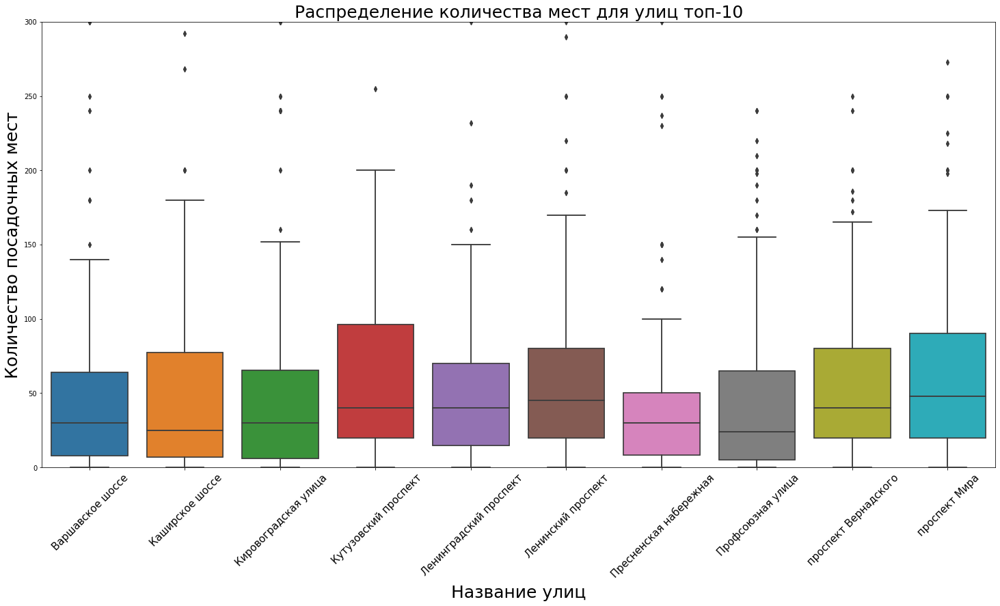

In [40]:
# Построим график
 
plt.figure(figsize=(25,12))
sns.boxplot(data=popular_df, x='street', y='number')
ax = sns.boxplot('street', 'number', data= popular_df)
ax.set_title('Распределение количества мест для улиц топ-10',fontsize=(25))
ax.set_ylabel('Количество посадочных мест', fontsize=(25))
ax.set_xlabel('Название улиц', fontsize=(25))
ax.set_xticklabels(ax.get_xticklabels(),rotation=45,fontsize=(15))
plt.ylim(0,300)
plt.show()

Среднее количество посадочных мест , скорее всего, зависит от трафика на них, ведь зачем иметь в кафе 40 посадочных мест, если трафик там всего 40 за час? Данный график дает нам возможность рассмотреть конкурентов по их посадочным местам на конкретной улице


## Общий вывод
### Шаг №1. Загрузите данные и подготовьте их к анализу
 - Предоставленные данные о ресторанах г. Москвы имеют правильный формат данных, пропущенные значения. В Дататфрейме обнаружено 85 скрытых дубликатов. Кто-то занес 85 заведений по одному адресу дважды под  разным id. Следует обратить на это внимание в дальнейшем

### Шаг №2. Анализ данных
 - В лидерах по количеству заведений у нас кафе, столовые и рестораны
 - 80 % заведений нашего датафрейма являются сетевыми
 - Самое высокое сетевое распростронение характерно для таких заведений, как:
    - Предприятие быстрого обслуживания( почти 70% заведений - сетевые)
    - Кулинария (40% сетевых заведений)
    - Ресторан (31% сетевых заведений)
    - Кафе (29% сетевых зачедений)
 - Для сетевых заведений характерно большое количество точек с не большими заламии на 40-50 посадочных мест
 - Самое большое количество посадочных мест на заведение принадлежит столовым и ресторанам, так как первым нужно уместить максимальное количество гостей в прайм-тайм(обед , ужин и тд), а ресторанам проводить крупные мероприятия(свадьбы, корпаративы и тд)
 - Районы Тверской, Таганский, Басманный и Хамовники имеют самое большое количество улиц с одним заведением. Конкуренция там, судя по всему, меньше, но рисков больше - аренда там одна из самых дорогих. Стоит хорошенько просчитать бизнес моделей, чтобы не закрыться через пару месяцев
 - Среднее количество посадочных мест , скорее всего, зависит от трафика на них, ведь зачем иметь в кафе 40 посадочных мест, если трафик там всего 40 за час? Данный график дает нам возможность рассмотреть конкурентов по их посадочным местам на конкретной улице
### Рекомендации

Львиная доля рынка принадлежит кафе, что само по себе не удивительно - бесконечное число форматов концепций и тд. На разный вкус и кошелек. Поэтому идею открыть кафе считаю удачным - формат очень популярный, а такая идея, как робо-кафе ,думаю, что заинтересует клиентов.
В сегменте кафе обстановка не плохая - всего лишь 30% заведений является сетевыми, и здесь есть поле для манёвра , не боясь быть съеденными крупными корпорациями.
В сетевых заведениях уже просчитана и обкатана бизнес модель - изобретать велосипед, думаю, что не стоит и довериться данным.
Оптимальное число посадочных мест для кафе - 40 штук.
Количество посадочных мест в свою очередь зависит от трафика на улицах, где будет располагаться кафе , ведь зачем иметь в кафе 40 посадочных мест, если трафик там всего 40 человек за час? При выборе места и количестве посадочных мест можно опираться на график «Распределения посудных мест по улицам».
Районы Тверской, Таганский, Басманный и Хамовники имеют самое большое количество улиц с одним заведением. Конкуренция там, судя по всему, меньше, но рисков больше - аренда там одна из самых дорогих. Стоит хорошенько просчитать бизнес моделей, чтобы не закрыться через пару месяцев



## Презентация 

Презентация здесь - https://yadi.sk/d/eJe5DEcM6yAM1A